# Motivation Notebook


In this notebook various examples of audio data augmentation techniques are described in relation with physical world and/or approaches existing in other domains. This notebook also illustrates various views of audio data and problems associated with audio recordings.


In [1]:
import sys
import os
sys.path.append(os.path.abspath("py/"))

from augmenters import *
from helpers import *
from setup import *

names = ['Original Recording Example.mp3',
         'Hall Recording Example.mp3', 'Street Recording Example.mp3']

path_pref = '../Examples/'

add_audio = True

## Real World Examples


To illustrate some specifics of this domain, [artificial recording](../Examples/Original%20Recording%20Example.mp3) was created. It was than played back in a real environment, such as [university hall](../Examples/Hall%20Recording%20Example.mp3) and [street](../Examples/Street%20Recording%20Example.mp3) in order to illustrate some of the changes that can affect the target sound (the one that has to be analysed) while recording.
Below, 2 most common views of audio data are described. These views are then used to illustrate differences between artificial recording and its real-world copies.


**First** comes the original artificial recording. It was created using digital tools and has never gone through a playback - record cycle, meaning that it is not recorded by a microphone, but is synthetically generated, keeping it free from various recording defects and environmental noises. To describe such data, we normally use either a waveform view or a spectrogram. Waveform view is an amplitude/time visualization, similar to views known in time series analysis. It is generally effective yet is insufficient to describe an audio signal properly. Alternative to it is a spectrogram view, where time remains an x-axis, while amplitude becomes a color bar and frequency component becomes the y-axis. This view allows us to describe an audio recording with change of frequency component over time.


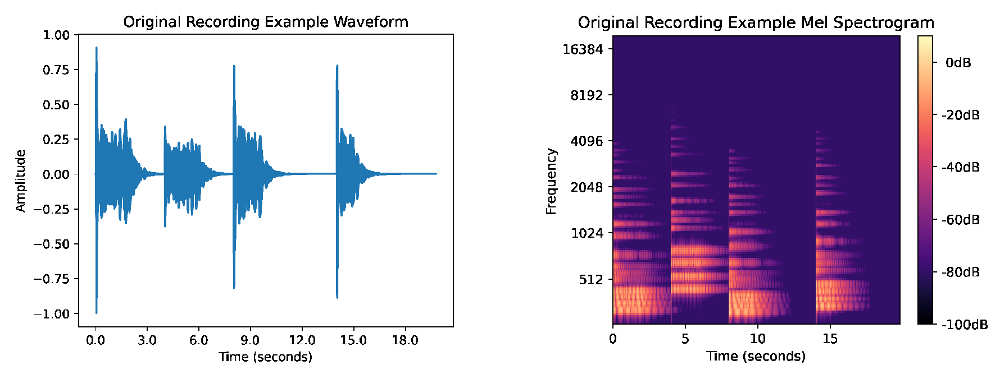

In [2]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
plot_sample(y, sr, include_audio=add_audio,label=file_name.split('.')[0])

**The second** recording was taken in a university hall. While there is a hearable echo on the recording, waveform view tells us hardly anything about it. Spectrogram view is, in contrary, slightly more informative. We can, for example, see, that everything has become a bit smoother along x-axis, compared to an original sounds spectrogram.

In addition to this "smoothing" effect, hall recording also exhibits some noise and digital clipping, that must've come from the recording device itself.


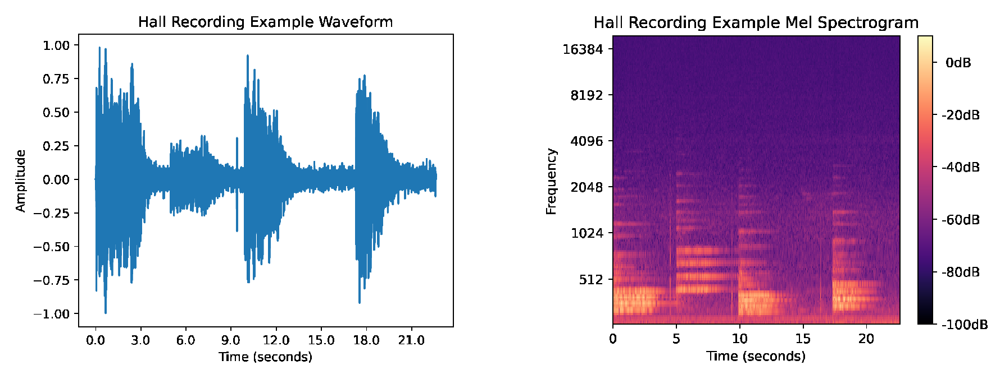

In [3]:
file_name = names[1]
y = load_audio(path_pref + file_name, sr=sr)
plot_sample(y, sr, include_audio=add_audio, label=file_name.split('.')[0])

**The third** recording is somewhat similar to the second one, yet it was recorded on the street, exposing recording device to different kind of noise. This one is also free from strange clipping effect seen on a previous one, but noise is a lot more noticeable.


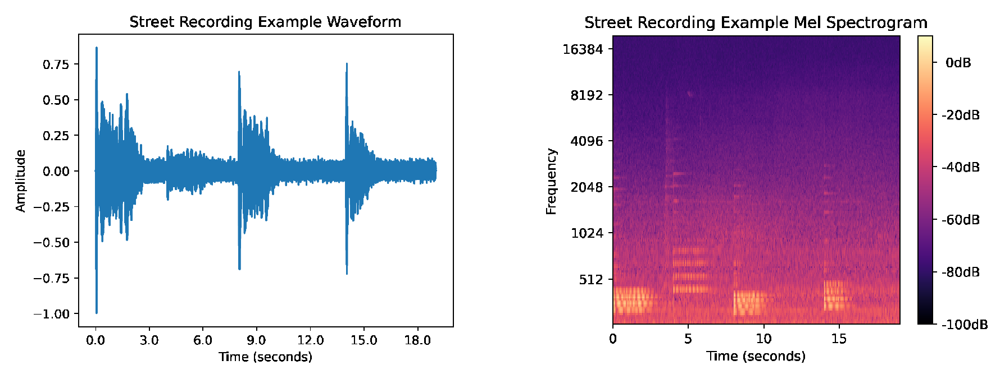

In [4]:
file_name = names[2]
y = load_audio(path_pref + file_name, sr=sr)
plot_sample(y, sr, include_audio=add_audio, label=file_name.split('.')[0])

These sounds perfectly illustrate what "deformations" sound recordings go through in the real environment. A model applied to a real-world data is likely to be exposed to these and further degenerative effects.

The main goal of such model is usually to distinguish target sound from the environment and then drive certain conclusions from it. Various data augmentation techniques can help to achieve this goal.

Although it is not the main topic of this paper, a brief note should be made about parameters of various spectrogram views.


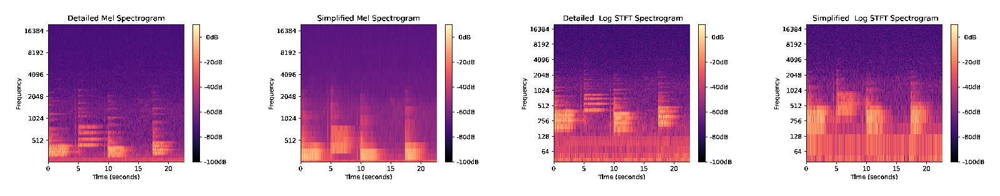

In [5]:
fig, axs = plt.subplots(1, 4, figsize=(8, 4), dpi=250)
file_name = names[1]
y = load_audio(path_pref + file_name, sr=sr)

axs[0].axis('off')
axs[0].imshow(build_spec(y, sr, mode="mel", num_filters=186, db=(-100, 10),
              flim=(20, 20000), label="Detailed"), interpolation='nearest')
axs[1].axis('off')
axs[1].imshow(build_spec(y, sr, mode="mel", num_filters=32, db=(-100, 10),
              flim=(20, 20000), label="Simplified"), interpolation='nearest')
axs[2].axis('off')
axs[2].imshow(build_spec(y, sr, mode="log", num_filters=2056, db=(-100, 10),
              flim=(20, 20000), label=" Detailed "), interpolation='nearest')
axs[3].axis('off')
axs[3].imshow(build_spec(y, sr, mode="log", num_filters=512, db=(-100, 10),
              flim=(20, 20000), label=" Simplified "), interpolation='nearest')
plt.show()

Basically, there are 2 most common ways how we generate spectrograms:

1. Standard STFT (Short-time Fourier transform) Spectrogram - Original signal is decomposed into Fourier series and its coefficients are then used to determine power of each frequency component. The most basic form uses linear y-scale, but log y-scale appears to be a bit more popular in existing studies and is definitely allowing for more information to appear within hearable (20Hz - 20 000Hz)domain.

2. Mel Spectrogram - is a slightly altered version. STFT coefficients are obtained using improved approach and y-axis is not linear nor log one, but is a mel-scale, which is based on human ear perception survey.

Both types of spectrograms are useful, but for our purpose Mel spectrogram appears to be a bit more useful, as it does not show any notable issues withing lower frequency range and seem to be working a bit better with noise. Also, in current realization it takes less time to get a mel spectrogram, compared to STFT one, this is going to play a huge role when batch-processing bigger dataset.

Note that in both cases "precision" of the view is determined through number of components/filters. Decomposition of an input into Fourier series with n components is going to be less precise (therefore, less informative) than similar decomposition with, for example, 2\*n components. Practical limitation here is that spectrograms are then rendered into images of a fixed size (224x224 pixels). It is therefore not beneficial to spend additional time on generation of highly-precise spectrograms that are then going to be represented in low-resolution image.


# Data Augmentation Techniques


Considering the problems mentioned above, the main goal of data augmentation techniques, applicable to audio data, should be to enlarge a dataset in a way that would help a model trained on it to perform better. For instance, in remote-sensing domain, usefull technqie would be a rotation of an image, if its contents can indeed be recorded with an angle. Alternatively, addition of noise to an original sample can prove to be meaningful if real data is also likely to be exposed to some kind of noise.

The main problem for this work is that augmentation approaches for this work are not studied well-enough. We compare few of the approaches described in existing literature and propose few additional ones. All considering the specificity of audio data.


## 1. Heavy Distortion

As Described in the literature, heavy distortion of a recording turned out to be an effective data augmentation technique. In original paper (see thesis for proper citation) under "Heavy Distortion" was described a combination of sample rate and bit rate reduction, as well as addition of noise and clipping of the sound. The software providing this effect is still freely available, yet it is hard to reuse. Instead, we recreate similar effect using Pedalboard Python package, designed and maintained by Spotify team. An example can be seen below.


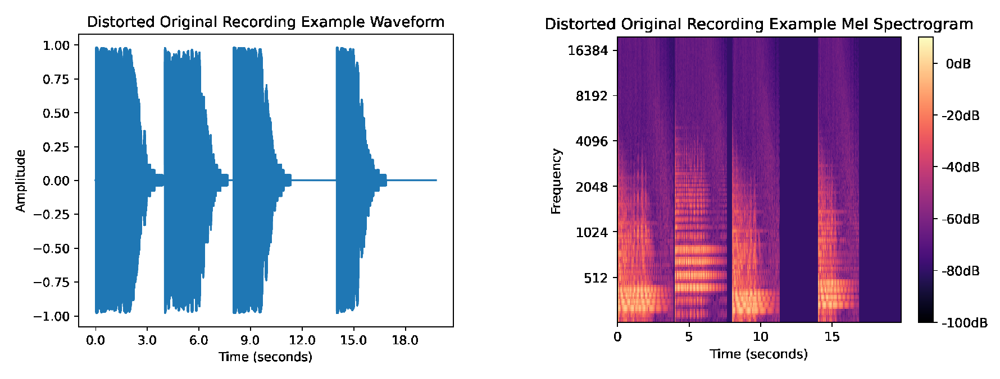

In [6]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
y = bitcrusher_effect(y, sr)
efn = "Distorted "
plot_sample(y, sr, include_audio=add_audio,
            label=efn + file_name.split('.')[0])
save_audio(path_pref + efn + file_name.split('.')[0] + ".wav",y, sr)

## 2. Delay

Delay is a technique proposed in this work. It is a very common audio effect that is widespread in real environment. Alternative name is echo.
Practically speaking it is an effect resulting in copy of the original signal, delayed in time, to be mixed with the original sound.
In physics this is mostly caused by reflection of sound waves from the walls of a room. This effect is proposed to be used as an augmentation technique, as it mostly affects signal alongside time axis, possibly allowing models to distinguish similar events happening in slightly different time points.


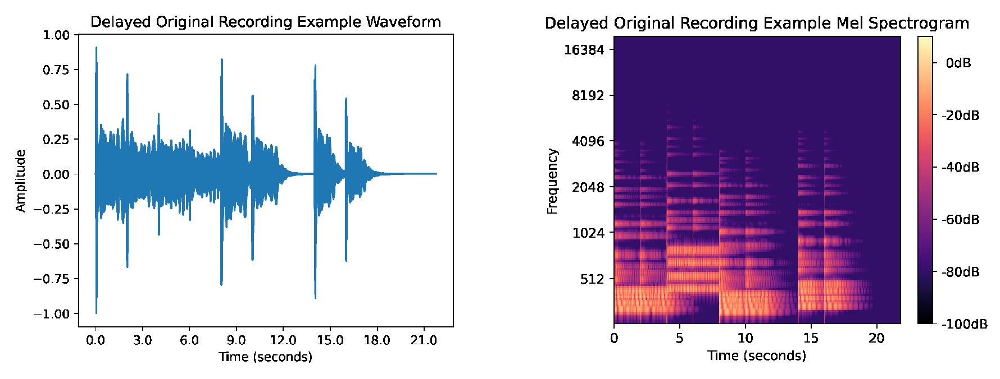

In [7]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
y = simple_delay(y, sr, delay_time=0.1, trim=False)
efn = "Delayed "
plot_sample(y, sr, include_audio=add_audio,
            label=efn + file_name.split('.')[0])
save_audio(path_pref + efn + file_name.split('.')[0] + ".wav",y, sr)

## 3a. Audio MixUp

MixUp is a common technique used in computer vision. 2 images are mixed together with a certain parameter alpha (take alpha % of the first image and (1-alpha) % of the other one). Images can be from different classes of from the same one, class label of the retrieved image is normally a mix of original labels.

The method itself proved to be useful. However, it has few drawbacks when applied to the audio data. Few studies proposed to just mix spectrogram images, yet there is a major problem regarding axis scaling here. If we were to consider two audio recordings which are of different lengths, and this is the case with the dataset used further in this study, their time-axis on the spectrogram would not be the same, resulting in some kind of surreal mix of images. The same could happen to frequency and power axes.

Instead, we propose to combine signals at their audio view. Adding 2 scaled vectors, taken the output length as a length of a bigger recording, zero-padding the shorter one. As a result we retrieve a recording that fits physical meaning of 2 sounds being mixed together, and not some abstract image mixing.


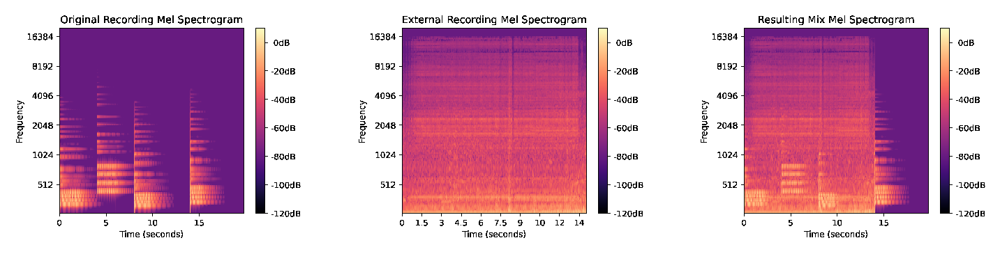

In [8]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
y_ext = load_audio(path_pref + "New Recording.mp3", sr=sr)
y_n, _ = audio_mixup(y, y_ext, 1, 2, alpha=0.7)

im1 = build_spec(y, sr, mode="mel", num_filters=186,
                 db=udb, flim=uflim, label='Original Recording')

im2 = build_spec(y_ext, sr, mode="mel", num_filters=186,
                 db=udb, flim=uflim, label='External Recording')

ime = build_spec(y_n, sr, mode="mel", num_filters=186,
                 db=udb, flim=uflim, label='Resulting Mix')

efn = "AMixUp "
save_audio(path_pref + efn + file_name.split('.')[0] + ".wav",y_n, sr)
fig, axs = plt.subplots(1, 3, figsize=(8, 6), dpi=224)
axs[0].axis('off')
axs[0].imshow(im1, interpolation='nearest')
#axs[0].title.set_text('Original')
axs[1].axis('off')
axs[1].imshow(im2, interpolation='nearest')
#axs[1].title.set_text('External sound')
axs[2].axis('off')
axs[2].imshow(ime, interpolation='nearest')
#axs[2].title.set_text('Result')
plt.show()

## 3b. Image MixUp


In contrary to 3a, 3b is the original image-mixing technique, note the considerable difference in the result


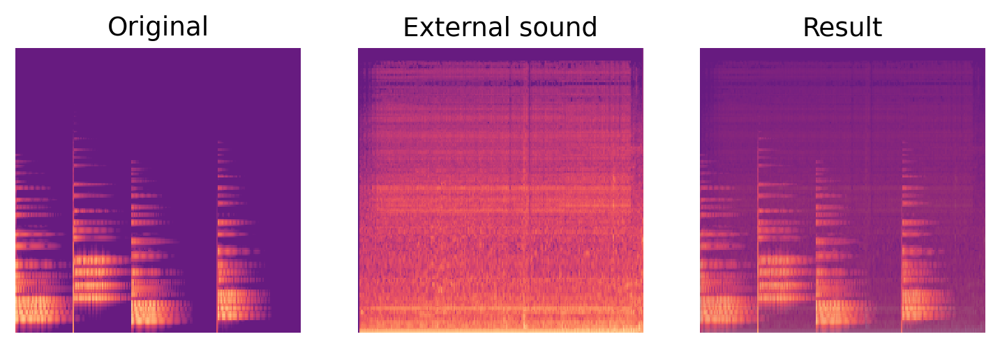

True

In [9]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
im1 = build_spec(y, sr, mode="mel", num_filters=186,
                 db=udb, flim=uflim, label=None)

y_ext = load_audio(path_pref + "New Recording.mp3", sr=sr)
im2 = build_spec(y_ext, sr, mode="mel", num_filters=186,
                 db=udb, flim=uflim, label=None)
ime = img_mixup(im1, im2, alpha=0.66)
fig, axs = plt.subplots(1, 3, figsize=(8, 6), dpi=224)
axs[0].axis('off')
axs[0].imshow(im1, interpolation='nearest')
axs[0].title.set_text('Original')
axs[1].axis('off')
axs[1].imshow(im2, interpolation='nearest')
axs[1].title.set_text('External sound')
axs[2].axis('off')
axs[2].imshow(ime, interpolation='nearest')
axs[2].title.set_text('Result')
plt.show()

cv2.imwrite(plot_directory+"MixUp_example.png", ime)

## 4. Image Warping

One of the related works suggested image warping as a relevant augmentation technique. This technique is usually applied in other domains of computer vision, technique itself can only be applied to spectrograms and has little to no meaning in audio. Basically, Image warping produces a copy of an input image, where shapes are linearly deformed. Deformation rules are set by so-called warping points. In our case these are randomly generated with certain constraints to produce not-so-strong deformations. Note that as a result we acheive deformation alongside both x- and y- axes, there is little to no change in color, though.


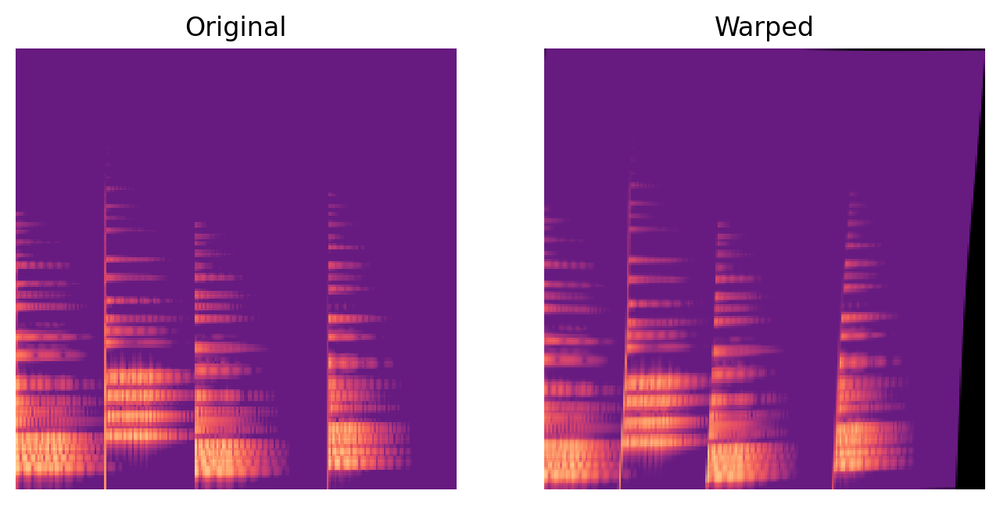

True

In [10]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
im = build_spec(y, sr, mode="mel", num_filters=186,
                db=udb, flim=uflim, label=None)
new_im = WarpImage_TPS(im, strength=0.05)
fig, axs = plt.subplots(1, 2, figsize=(8, 6), dpi=200)
axs[0].axis('off')
axs[0].imshow(im, interpolation='nearest')
axs[0].title.set_text('Original')
axs[1].axis('off')
axs[1].imshow(new_im, interpolation='nearest')
axs[1].title.set_text('Warped')
plt.show()
cv2.imwrite(plot_directory+"Warped_example.png", new_im)

## 5. Room Simulation

As most of the augmentation techniques described in this work are in some way mimicking "deformations" that can be caused by real environment, it is also an option to play a recording through a virtual room, that can cause various echoes and noises to add to the original recording.

For this purpose python package called pyroomacoustics is used. It allows to create a room of any form, with any kind of walls and obstacles, it can even allow researches to set an array of microphones and sound sources. Deciding on exact setup can be tricky, and should probably depend on the final task in mind, but for our purpose basic room should be enough to illustrate the effect. Detailed setting is provided in augmenters.py. Note that the resulting sound has some reverberation, noise, delay - deformations slightly similar to those mentioned previously (hear [university hall](../Examples/Hall%20Recording%20Example.mp3) as an example). The main drawback of this approach is speed. Computing this effect is comparatively costly.


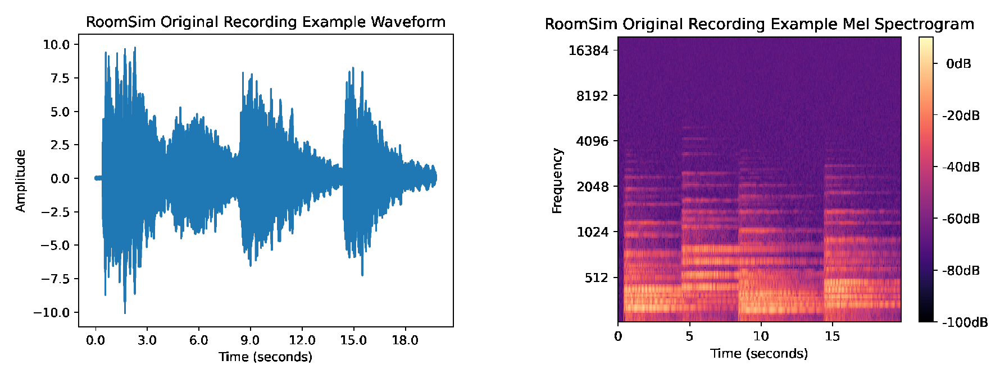

In [11]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
y = simulate_room(y, sr=sr, room_dim=[10, 20, 10], rt=1.5)

efn = "RoomSim "
plot_sample(y, sr, include_audio=add_audio,
            label=efn + file_name.split('.')[0])
save_audio(path_pref + efn + file_name.split('.')[0] + ".wav",y, sr)